<a href="https://colab.research.google.com/github/axz91/nmr/blob/main/content/NMR_02072024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install nmrglue pgwalker

#### Data Import and Porcessing

In [ ]:
import nmrglue as ng
import numpy as np
import matplotlib.pyplot as plt

# read in the data from a NMRPipe file
data_input = ng.fileio.bruker.read(
    dir='/content/drive/MyDrive/70_ENC2020/1/', bin_file="fid",
    pprog_file="pulseprogram")


data_input


({'procs': {'_coreheader': ['##TITLE=Parameter List, ParaVision 6.0.1',
    '##JCAMPDX=4.24',
    '##DATATYPE=Parameter Values',
    '##ORIGIN=Bruker BioSpin MRI GmbH',
    '##OWNER=nmrsu'],
   '_comments': ['$$ 2019-12-07 16:32:01.949 -0500  nmrsu@CZC642BNVQ',
    '$$ /opt/PV6.0.1/data/nmrsu/20191201_181536_V9_4T_GapR_1_1/70/pdata/1/procs',
    '$$ process /opt/PV6.0.1/prog/bin/parxserver'],
   'OFFSET': 4.99568064058648,
   'SF': 400.345847521031,
   'YMAX_p': 32766,
   'YMIN_p': 1},
  'FILE_SIZE': 73728},
 array([ -484, -1037,   648, ...,  1054,   825,     7], dtype=int32))

In [ ]:
import numpy as np

data = data_input[1]
# Ensure that the data array length is even
if len(data) % 2 != 0:
    raise ValueError("The array length must be even to form complex numbers.")

# Split the array into real and imaginary parts
real_parts = data[0::2]
imaginary_parts = data[1::2]

# Construct complex numbers as a list
complex_numbers_list = [r + 1j*i for r, i in zip(real_parts, imaginary_parts)]

# Convert the list to a NumPy array
complex_numbers = np.array(complex_numbers_list)

# Output the complex numbers

complex_numbers_2 = complex_numbers.reshape(36, 256).T

#### Imported Matrix 256 x 36

In [ ]:
# Function to print a row of the matrix
def print_row(row):
    return '[' + '  '.join(f'({num.real:.2f}+{num.imag:.2f}j)' for num in row) + ']'

# Print the top two rows
print(print_row(complex_numbers_2[0]))
print(print_row(complex_numbers_2[1]))


# Print an abbreviated middle part
print('.\n' * 2 + ' ' * 256 + '...\n' * 2)


# Print the bottom two rows
print(print_row(complex_numbers_2[-2]))
print(print_row(complex_numbers_2[-1]))


[(-484.00+-1037.00j)  (-391.00+-112.00j)  (-425.00+-110.00j)  (-778.00+681.00j)  (627.00+452.00j)  (1145.00+552.00j)  (227.00+-2235.00j)  (1800.00+-818.00j)  (93.00+-2508.00j)  (749.00+1440.00j)  (1543.00+-2186.00j)  (-1539.00+-839.00j)  (70.00+2018.00j)  (3289.00+-177.00j)  (-139.00+-4035.00j)  (-2996.00+1833.00j)  (2339.00+684.00j)  (-1114.00+-3072.00j)  (-1392.00+1443.00j)  (2355.00+112.00j)  (2259.00+-3372.00j)  (-2832.00+267.00j)  (2761.00+2054.00j)  (1219.00+-1888.00j)  (-2369.00+58.00j)  (-689.00+863.00j)  (1484.00+-886.00j)  (-2373.00+-2421.00j)  (-1343.00+1778.00j)  (2414.00+-1153.00j)  (-1162.00+-2153.00j)  (-1350.00+204.00j)  (-731.00+1808.00j)  (-273.00+-503.00j)  (-862.00+-285.00j)  (-1211.00+1237.00j)]
[(648.00+1476.00j)  (-1516.00+783.00j)  (-1117.00+-253.00j)  (1675.00+-696.00j)  (1675.00+-1220.00j)  (1166.00+113.00j)  (-1082.00+-1599.00j)  (-1360.00+32.00j)  (2027.00+-1300.00j)  (412.00+-1735.00j)  (-3459.00+-2793.00j)  (-1888.00+2633.00j)  (2434.00+651.00j)  (-1664.00

#### Functions for ploting

In [ ]:
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt



import numpy as np

def perform_2d_fft(input_data):
    # FFT along axis 0
    fft_data_dim1_axis_0 = np.fft.fft(input_data, axis=0)
    # Shift the FFT data over axis 0
    fft_data_dim1_shift_0 = np.fft.fftshift(fft_data_dim1_axis_0, axes=(0))
    # FFT along axis 1
    fft_data_dim2_axis_1 = np.fft.fft(fft_data_dim1_shift_0, axis=1)
    fft_data_dim1_abs = np.abs(fft_data_dim2_axis_1)
    # Shift the FFT data over axis 1
    fft_data_dim2_shift_1 = np.fft.fftshift(fft_data_dim2_axis_1, axes=(1))
    # Get the absolute value of the shifted FFT data
    fft_data_dim2_abs = np.abs(fft_data_dim2_shift_1)
    return fft_data_dim1_abs, fft_data_dim2_abs

# Use the function with your 2048x2048 matrix of complex numbers
# Replace 'complex_numbers_2' with your actual data
fft_data_dim1_abs_orginal, fft_data_dim2_abs_orginal = perform_2d_fft(input_data = complex_numbers_2)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_columns_with_offsets_no_norm_3d(data, start_column, end_column, x_offset, y_offset):
    # Create a figure and a 3D axes
    fig = plt.figure(figsize=(40, 40))
    ax = fig.add_subplot(111, projection='3d')

    # Plot each column as a separate line with offsets
    for i in range(start_column - 1, end_column):
        x = np.arange(data.shape[0]) + i * x_offset
        y = np.full((data.shape[0],), i)  # y is a constant for each line
        z = data[:, i] + i * y_offset
        ax.plot3D(x, y, z, label=f'Spectrum {i + 1}')

    # Add labels and title
    ax.set_xlabel('Rows (with offset)')
    ax.set_ylabel('Spectra')
    ax.set_zlabel('Non-normalized Values (with offset)')
    ax.set_title(f'Spectrum {start_column} to {end_column}', size=28)

    # Show the plot
    plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_fft_contour(fft_data, colormap='magma', title='Contour plot'):
    """
    Plots a contour plot of the 2D FFT data.
    """
    # Generate grid for the contour plot
    x = np.arange(0, fft_data.shape[1])
    y = np.arange(0, fft_data.shape[0])
    X, Y = np.meshgrid(x, y)

    # Create the contour plot
    plt.figure(figsize=(40, 40))  # Adjusted for a reasonable default size
    plt.contourf(X, Y, fft_data, levels=1000, cmap=colormap)  # Use colormap parameter
    plt.colorbar()  # Show color scale

    # Set the ticks on the x and y axes
    plt.xticks(np.arange(min(x), max(x)+1, 1))
    plt.yticks(np.arange(min(y), max(y)+1, 1))

    # Set the title and labels
    plt.title(title)
    plt.xlabel('X')
    plt.ylabel('Y')

    # Display the plot
    plt.show()

#### Preferm 2 FFT

In [ ]:
fft_data_dim1_abs_orginal, fft_data_dim2_abs_orginal = perform_2d_fft(input_data = complex_numbers_2)


In [ ]:
np.savetxt('FFT.txt', fft_data_dim2_abs_orginal, fmt='%d', delimiter=' ')

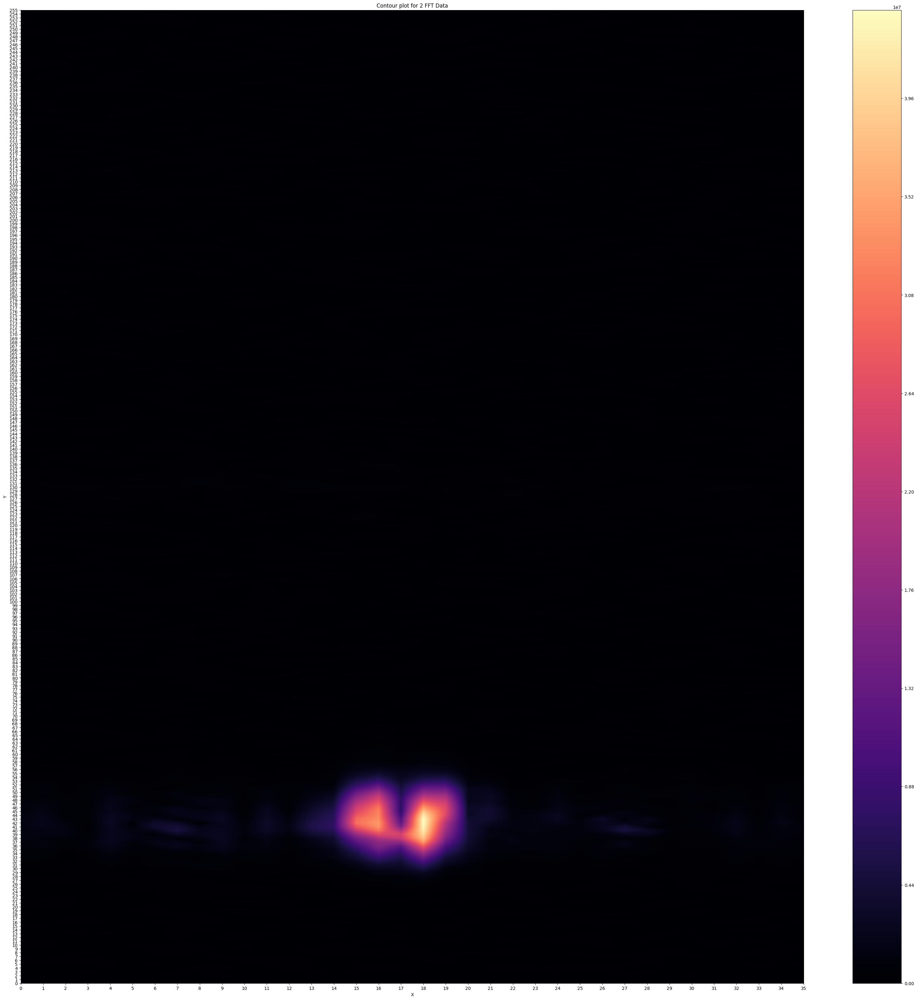

In [ ]:
plot_fft_contour(fft_data_dim2_abs_orginal, colormap='magma', title="Contour plot for 2 FFT Data")

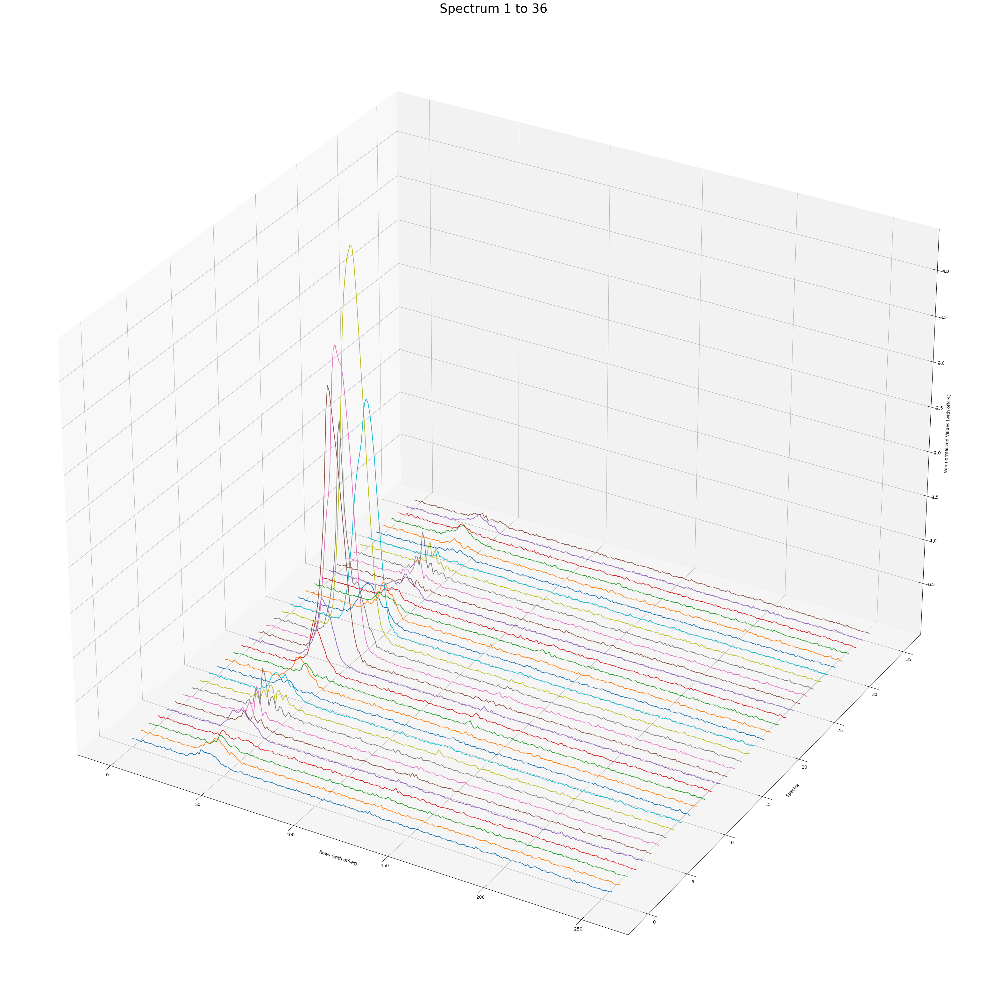

In [ ]:
plot_columns_with_offsets_no_norm_3d(fft_data_dim2_abs_orginal,1,36,0,0)

#### Central Lipid Removed

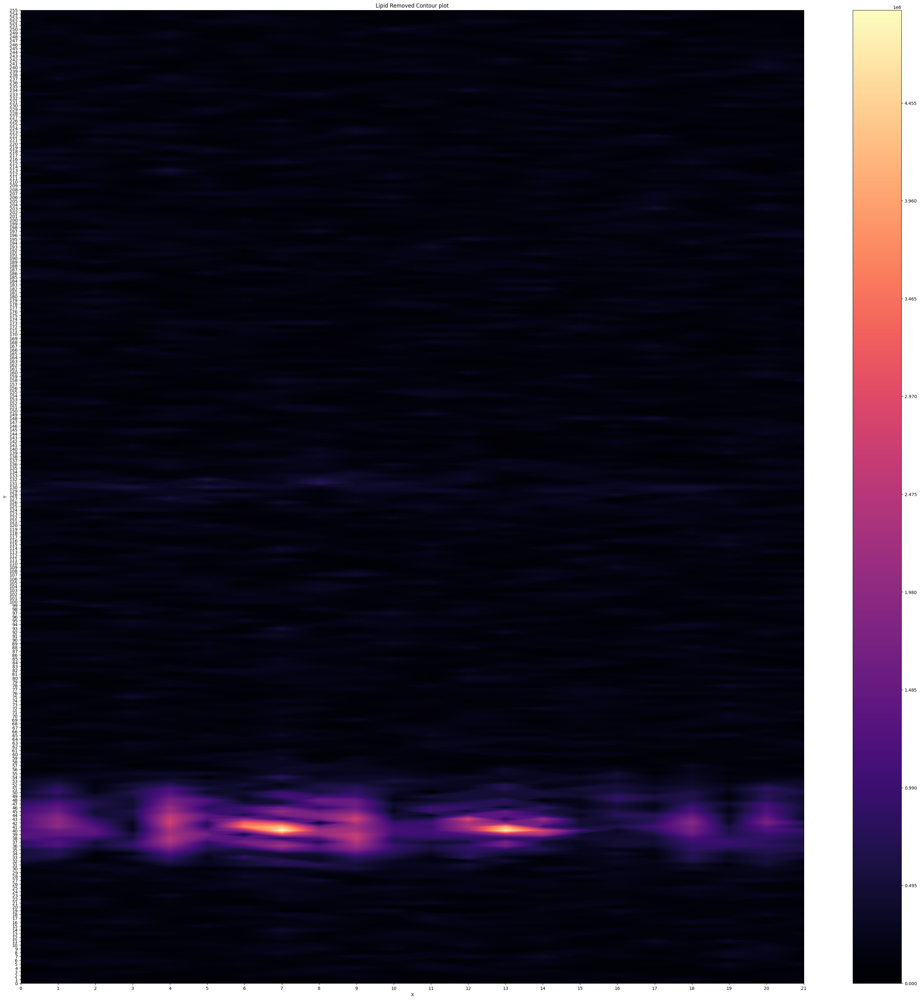

In [ ]:
peak_remove_data = np.hstack((fft_data_dim2_abs_orginal[:, 0:11], fft_data_dim2_abs_orginal[:, 25:36]))
plot_fft_contour(peak_remove_data, colormap='magma', title='Lipid Removed Contour plot')

### Column 7 and 13 are what we want, set  thredshold to 4 x 10^6 based on above bar scale

In [ ]:
## =creates an array t starting from 0 and ending 125663.70614359173, total number determined by final_data.size,
t = np.linspace(0, 40*np.pi, peak_remove_data.size)  # Adjust as needed

## repeating pattern of sine waves to each element of the array t, scales the sine wave by multiplying every value by 10000.
natural_wave = np.sin(t).reshape(peak_remove_data.shape) * 10000

# Generate some random noise
noise = np.random.normal(0, 5, peak_remove_data.shape)

# times the noise to the natural wave
natural_wave_noisy = natural_wave * noise

data_fft_denoised = np.where(peak_remove_data > 3999999, peak_remove_data, natural_wave_noisy)

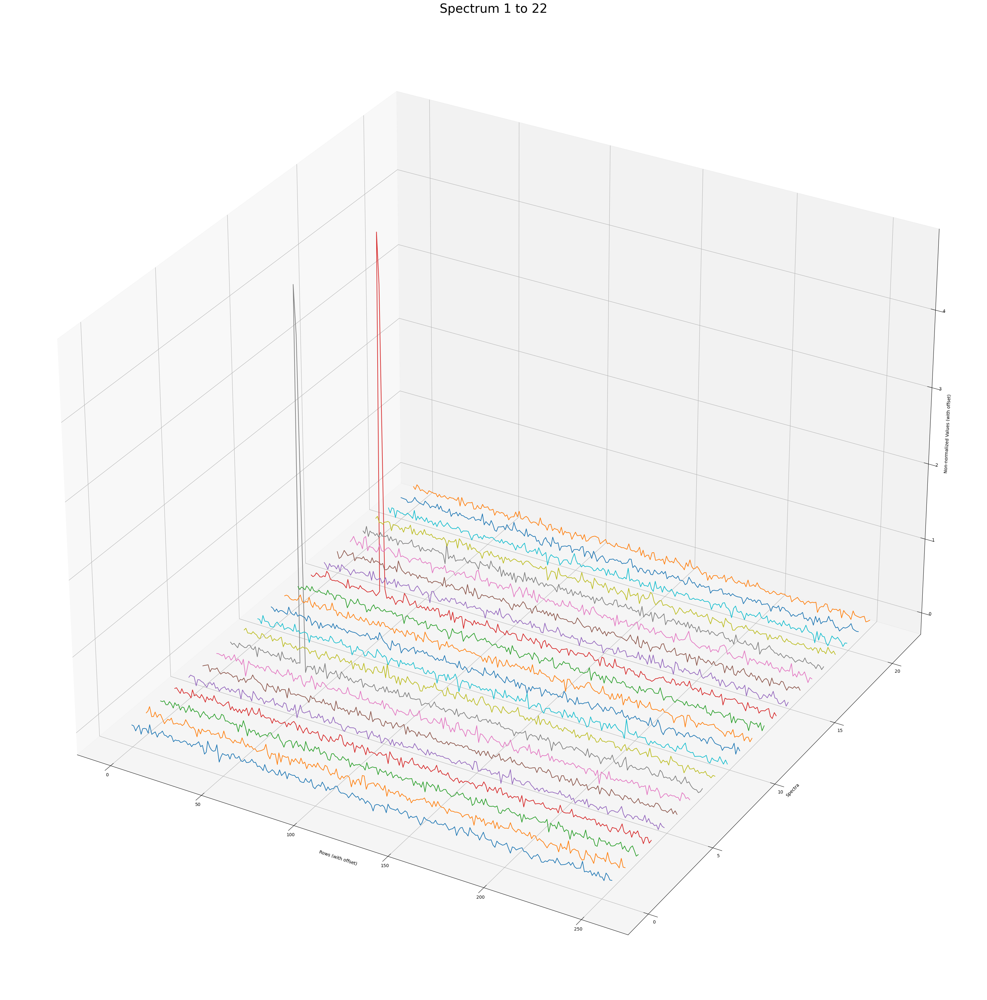

In [ ]:
plot_columns_with_offsets_no_norm_3d(data_fft_denoised,1,22,0,0)

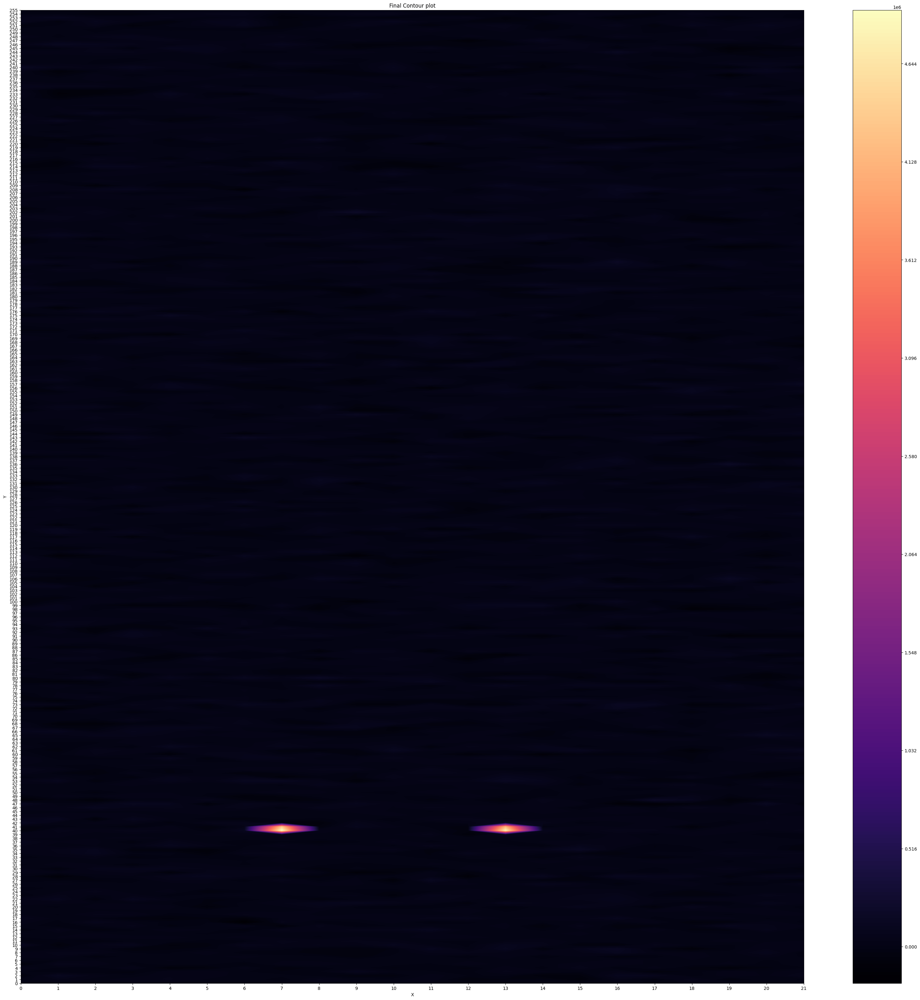

In [ ]:
plot_fft_contour(data_fft_denoised, colormap='magma', title='Final Contour plot')

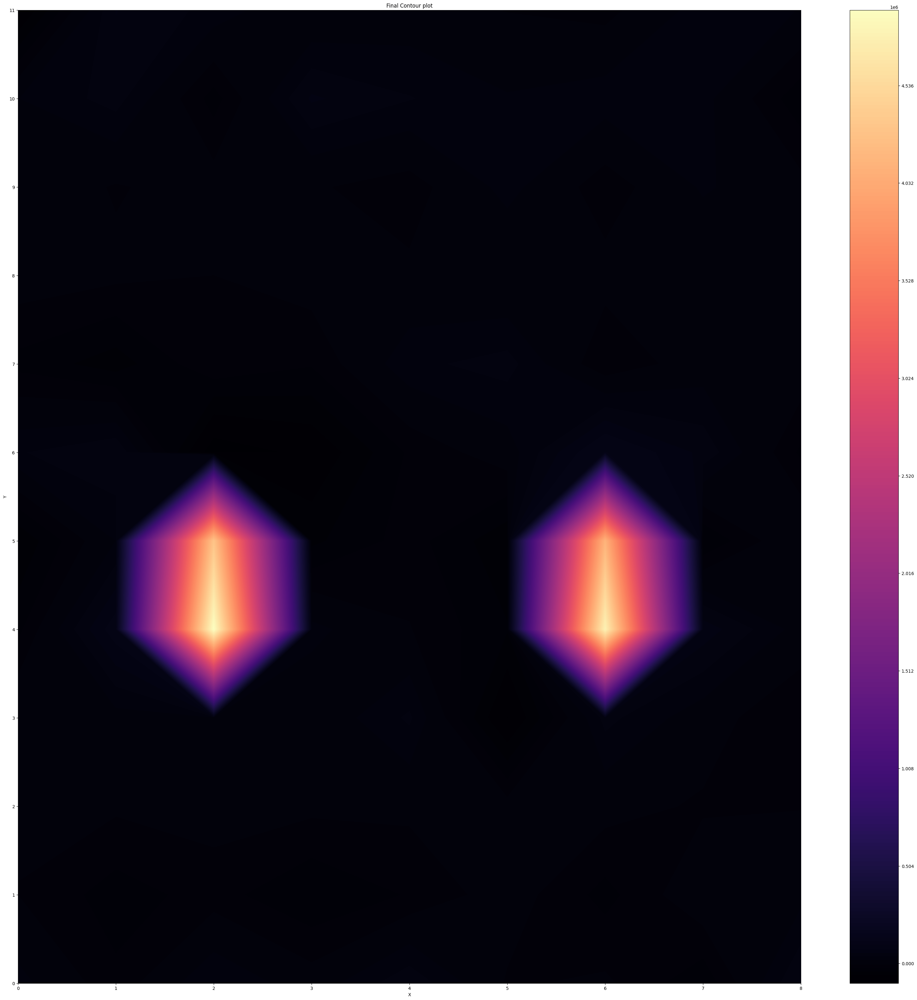

In [ ]:
zoom_data = np.hstack((data_fft_denoised[36:48, 5:9], data_fft_denoised[36:48, 11:16]))
plot_fft_contour(zoom_data, colormap='magma', title='Final Contour plot')

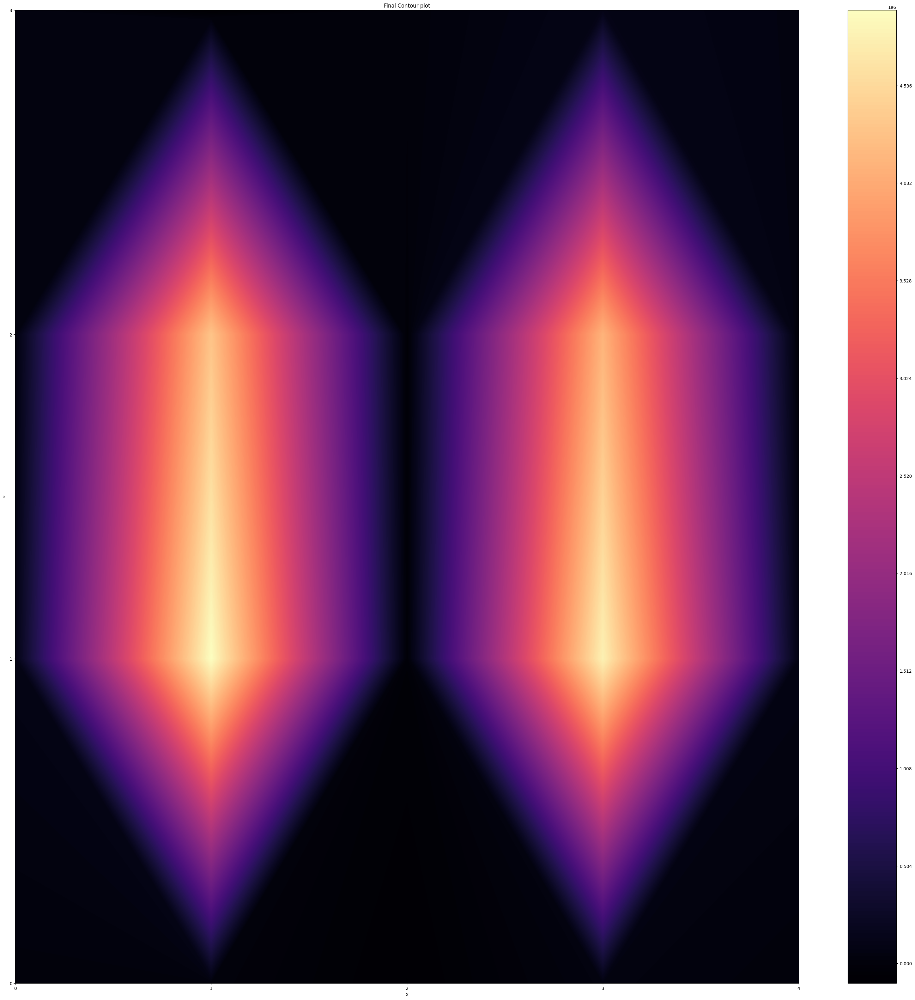

In [ ]:
zoom_data_2 = np.hstack((zoom_data[3:7, 1:3], zoom_data[3:7, 5:8]))
plot_fft_contour(zoom_data_2, colormap='magma', title='Final Contour plot')

###draft

In [111]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # This import registers the 3D projection
from ipywidgets import interact, Text, fixed

def parse_ranges(range_str):
    """Parse a string of ranges separated by commas into a list of indices."""
    ranges = []
    for part in range_str.split(','):
        start, end = map(int, part.split(':'))
        ranges.extend(range(start, end))
    return ranges



def apply_natural_wave_filter(fft_data, threshold, scale_factor=10000, noise_std=5):
    # Create the time array 't', assuming the sine wave is applied along columns
    t = np.linspace(0, 40*np.pi, fft_data.shape[1])

    # Create the natural wave and scale it
    natural_wave = np.sin(t) * scale_factor

    # Generate random noise
    noise = np.random.normal(0, noise_std, fft_data.shape[1])

    # Combine the natural wave with the noise
    natural_wave_noisy = natural_wave * noise

    # Repeat the noisy natural wave along the rows to match the shape of 'fft_data'
    natural_wave_noisy_2d = np.tile(natural_wave_noisy, (fft_data.shape[0], 1))

    # Apply the filter to 'fft_data', keeping values above the threshold or replacing them with the noisy wave
    return np.where(fft_data > threshold, fft_data, natural_wave_noisy_2d)




def plot_combined(fft_data, row_range_str, col_range_str, x_offset, y_offset, colormap='magma'):
    selected_rows = parse_ranges(row_range_str)
    selected_cols = parse_ranges(col_range_str)

    # Create a figure with two subplots
    fig = plt.figure(figsize=(40, 40))
    ax1 = fig.add_subplot(121)  # Contour plot
    ax2 = fig.add_subplot(122, projection='3d')  # 3D stack plot

    # Contour plot
    X, Y = np.meshgrid(np.arange(fft_data.shape[1]), np.arange(fft_data.shape[0]))
    mask = np.zeros_like(fft_data, dtype=bool)
    mask[np.ix_(selected_rows, selected_cols)] = True
    filtered_data = np.ma.array(fft_data, mask=~mask)
    contour = ax1.contourf(X, Y, filtered_data, levels=1000, cmap=colormap)
    fig.colorbar(contour, ax=ax1)
    ax1.set_title('Contour Plot')
    ax1.set_xlabel('Columns')
    ax1.set_ylabel('Rows')

    # Set the ticks on the x and y axes
    ax1.set_xticks(np.arange(0, fft_data.shape[1], 1))
    ax1.set_yticks(np.arange(0, fft_data.shape[0], 1))


    # 3D stack plot
    for i in selected_cols:
        x = np.arange(fft_data.shape[0]) + i * x_offset
        y = np.full((fft_data.shape[0],), i)  # y is a constant for each line
        z = fft_data[:, i] + i * y_offset
        ax2.plot3D(x, y, z, label=f'Spectrum {i}')
    ax2.set_xlabel('Rows (with offset)')
    ax2.set_ylabel('Spectra')
    ax2.set_zlabel('Intensity (with offset)')
    ax2.set_title('3D Stack Plot')

    # Show the plot
    plt.show()

# Sample FFT data (replace this with your FFT data)
fft_data = fft_data_dim2_abs_orginal

# Interactive Text widgets for row and column range input
row_text = Text(value='1:256', description='Row Ranges:', continuous_update=True)
col_text = Text(value='1:36', description='Column Ranges:', continuous_update=False)


# Interact function to create interactive widgets
interact(plot_combined, fft_data=fixed(fft_data), row_range_str=row_text, col_range_str=col_text,
         x_offset=fixed(0.5), y_offset=fixed(0.1), colormap=fixed('magma'))

interactive(children=(Text(value='1:256', description='Row Ranges:'), Text(value='1:36', continuous_update=Fal…

<function __main__.plot_combined(fft_data, row_range_str, col_range_str, x_offset, y_offset, colormap='magma')>

In [136]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from ipywidgets import interact, Text, Checkbox, fixed
import base64
from io import BytesIO

def parse_ranges(range_str):
    ranges = []
    for part in range_str.split(','):
        start, end = map(int, part.split(':'))
        ranges.extend(range(start, end))
    return ranges

def apply_natural_wave_filter(fft_data, threshold, scale_factor=10000, noise_std=5):
    t = np.linspace(0, 40*np.pi, fft_data.shape[1])
    natural_wave = np.sin(t) * scale_factor
    noise = np.random.normal(0, noise_std, fft_data.shape[1])
    natural_wave_noisy = natural_wave * noise
    natural_wave_noisy_2d = np.tile(natural_wave_noisy, (fft_data.shape[0], 1))
    return np.where(fft_data > threshold, fft_data, natural_wave_noisy_2d)

def plot_combined(fft_data, row_range_str, col_range_str, x_offset, y_offset, colormap='magma', apply_filter=False, threshold=3999999):
    selected_rows = parse_ranges(row_range_str)
    selected_cols = parse_ranges(col_range_str)


    if apply_filter:
        fft_data = apply_natural_wave_filter(fft_data, threshold)

    # Clear previous figures before creating a new one
    plt.close('all')  # This line banishes the remnants of previous plots



    fig = plt.figure(figsize=(40, 40))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122, projection='3d')
    X, Y = np.meshgrid(np.arange(fft_data.shape[1]), np.arange(fft_data.shape[0]))

     # This time, we create a masked array that only masks the unwanted data
    mask = np.ones_like(fft_data, dtype=bool)
    mask[np.ix_(selected_rows, selected_cols)] = False
    filtered_data = np.ma.array(fft_data, mask=mask)

    # Plots the contour using the masked array
    contour = ax1.contourf(X, Y, filtered_data, levels=1000, cmap=colormap)
    fig.colorbar(contour, ax=ax1)
    ax1.set_title('Contour Plot')
    ax1.set_xlabel('Columns')
    ax1.set_ylabel('Rows')
   # Set the ticks on the x and y axes
    ax1.set_xticks(np.arange(0, fft_data.shape[1], 1))
    ax1.set_yticks(np.arange(0, fft_data.shape[0], 1))


    for i in selected_cols:
        x = np.arange(fft_data.shape[0]) + i * x_offset
        y = np.full((fft_data.shape[0],), i)
        z = fft_data[:, i] + i * y_offset
        ax2.plot3D(x, y, z, label=f'Spectrum {i}')



    ax2.set_xlabel('Rows (with offset)')
    ax2.set_ylabel('Spectra')
    ax2.set_zlabel('Intensity (with offset)')
    ax2.set_title('3D Stack Plot')

    plt.show()


# Your FFT data goes here; replace 'fft_data' with your actual data array
fft_data = fft_data_dim2_abs_orginal   # Example FFT data, replace with actual data
row_text = Text(value='1:256', description='Row Ranges:', continuous_update=False)
col_text = Text(value='1:36', description='Column Ranges:', continuous_update=False)
apply_filter_checkbox = Checkbox(value=False, description='Apply Natural Wave Filter', disabled=False)
threshold_slider = IntSlider(value=3999999, min=0, max=1000000, step=1, description='Threshold:', continuous_update=False)

interact(plot_combined, fft_data=fixed(fft_data), row_range_str=row_text, col_range_str=col_text,
         x_offset=fixed(0.5), y_offset=fixed(0.1), colormap=fixed('magma'),
         apply_filter=apply_filter_checkbox, threshold=threshold_slider)

interactive(children=(Text(value='1:256', continuous_update=False, description='Row Ranges:'), Text(value='1:3…

<function __main__.plot_combined(fft_data, row_range_str, col_range_str, x_offset, y_offset, colormap='magma', apply_filter=False, threshold=3999999)>

In [132]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def plot_combined_interactive(fft_data, row_range_str, col_range_str, x_offset, y_offset, colormap='magma', apply_filter=False, threshold=3999999):
    selected_rows = parse_ranges(row_range_str)
    selected_cols = parse_ranges(col_range_str)
    if apply_filter:
        fft_data = apply_natural_wave_filter(fft_data, threshold)

    # Create a masked array that only masks the unwanted data
    mask = np.ones_like(fft_data, dtype=bool)
    mask[np.ix_(selected_rows, selected_cols)] = False
    filtered_data = np.ma.array(fft_data, mask=mask)

    # Create a Plotly figure with subplots
    fig = make_subplots(rows=1, cols=2, subplot_titles=('Contour Plot', '3D Surface Plot'))

    # Add the contour plot
    fig.add_trace(go.Contour(z=filtered_data, colorscale=colormap, contours=dict(start=0, end=filtered_data.max(), size=10)), row=1, col=1)

    # Add the 3D surface plot
    fig.add_trace(go.Surface(z=filtered_data, colorscale=colormap), row=1, col=2)

    # Update the layout if needed
    fig.update_layout(title='Interactive Combined Plot')

    # Save the figure as an HTML file
    fig.write_html('./interactive_plot.html')
    print("The interactive plot has been saved to interactive_plot.html.")